<a href="https://colab.research.google.com/github/liadekel/analyzing-big-data/blob/master/TestAnalyzingBigData.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [4]:
!mkdir ./datasets
!mkdir /root/.kaggle/

import os
import json

api_token = {"username":"liaddekel","key":"a7d9f0891eaa96ed916617baa6b51167"}

with open('/root/.kaggle/kaggle.json', 'w') as file:
  json.dump(api_token, file)

mkdir: cannot create directory ‘./datasets’: File exists
mkdir: cannot create directory ‘/root/.kaggle/’: File exists


In [46]:
! pip install afinn
! pip install seaborn
! pip install plotly

     |████████████████████████████████| 61kB 2.7MB/s 
  Created wheel for afinn: filename=afinn-0.1-cp36-none-any.whl size=53452 sha256=d7ec30f35e9d49491fcd18e82c2e98c6b120c908d81f3933ff6cc34de5223297
  Stored in directory: /root/.cache/pip/wheels/b5/1c/de/428301f3333ca509dcf20ff358690eb23a1388fbcbbde008b2
Successfully built afinn


In [5]:
!mkdir ./datasets/novel-covid19

# download the dataset from Kaggle and unzip it
!kaggle datasets download sudalairajkumar/novel-corona-virus-2019-dataset -p ./datasets/novel-covid19
!unzip ./datasets/novel-covid19/*.zip  -d ./datasets/novel-covid19
!ls ./datasets/novel-covid19

mkdir: cannot create directory ‘./datasets/novel-covid19’: File exists
novel-corona-virus-2019-dataset.zip: Skipping, found more recently modified local copy (use --force to force download)
Archive:  ./datasets/novel-covid19/novel-corona-virus-2019-dataset.zip
replace ./datasets/novel-covid19/COVID19_line_list_data.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: n
replace ./datasets/novel-covid19/COVID19_open_line_list.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
  inflating: ./datasets/novel-covid19/COVID19_open_line_list.csv  
  inflating: ./datasets/novel-covid19/covid_19_data.csv  
  inflating: ./datasets/novel-covid19/time_series_covid_19_confirmed.csv  
  inflating: ./datasets/novel-covid19/time_series_covid_19_confirmed_US.csv  
  inflating: ./datasets/novel-covid19/time_series_covid_19_deaths.csv  
  inflating: ./datasets/novel-covid19/time_series_covid_19_deaths_US.csv  
  inflating: ./datasets/novel-covid19/time_series_covid_19_recovered.csv  
covid_19_data.csv		     time_series_c

**Gernal spread of `COVID-19` in china:**

In [6]:
import pandas as pd

COVID_19_PATH = "./datasets/novel-covid19/covid_19_data.csv"

covid_19_df = pd.read_csv(COVID_19_PATH)

# reduce to only china related
covid_19_df = covid_19_df[ covid_19_df['Country/Region'] == 'Mainland China']
# let's add active column as well
covid_19_df['Active'] = covid_19_df['Confirmed'] - covid_19_df['Recovered']

In [7]:
covid_19_df

,SNo,ObservationDate,Province/State,Country/Region,Last Update,Confirmed,Deaths,Recovered,Active
0,1,01/22/2020,Anhui,Mainland China,1/22/2020 17:00,1.0,0.0,0.0,1.0
1,2,01/22/2020,Beijing,Mainland China,1/22/2020 17:00,14.0,0.0,0.0,14.0
2,3,01/22/2020,Chongqing,Mainland China,1/22/2020 17:00,6.0,0.0,0.0,6.0
3,4,01/22/2020,Fujian,Mainland China,1/22/2020 17:00,1.0,0.0,0.0,1.0
4,5,01/22/2020,Gansu,Mainland China,1/22/2020 17:00,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...
52389,52390,06/28/2020,Tianjin,Mainland China,2020-06-29 04:33:44,198.0,3.0,194.0,4.0
52390,52391,06/28/2020,Tibet,Mainland China,2020-06-29 04:33:44,1.0,0.0,1.0,0.0
52454,52455,06/28/2020,Xinjiang,Mainland China,2020-06-29 04:33:44,76.0,3.0,73.0,3.0
52462,52463,06/28/2020,Yunnan,Mainland China,2020-06-29 04:33:44,185.0,2.0,183.0,2.0


In [8]:
!mkdir ./datasets/china-geojson

# since china provinces is not appearing in plotly as 'official' location, in order to color the differnet 
# regions we will need to use costume geojsons.
# download the china-geojson from Kaggle and unzip it
!kaggle datasets download quanncore/china-province-geojson -p ./datasets/china-geojson
!unzip ./datasets/china-geojson/*.zip  -d ./datasets/china-geojson
!ls ./datasets/china-geojson

mkdir: cannot create directory ‘./datasets/china-geojson’: File exists
china-province-geojson.zip: Skipping, found more recently modified local copy (use --force to force download)
Archive:  ./datasets/china-geojson/china-province-geojson.zip
replace ./datasets/china-geojson/gadm36_CHN_1.json? [y]es, [n]o, [A]ll, [N]one, [r]ename: A
  inflating: ./datasets/china-geojson/gadm36_CHN_1.json  
china-province-geojson.zip  gadm36_CHN_1.json


In [24]:
! pip install plotly
! pip install seaborn

In [12]:
import json
import plotly_express as px

with open('./datasets/china-geojson/gadm36_CHN_1.json') as f: 
     china_geojson = json.load(f)

px.choropleth(covid_19_df,
              geojson=china_geojson,
              locations='Province/State',
              color='Active',
              color_continuous_scale="Viridis",
              scope='asia',
              range_color=(0, 8000),
              featureidkey='properties.NAME_1',
              animation_frame='ObservationDate',
              title="Number of Active COVID-19 Cases")

# Guess which place is the one in the middle ? HUBEI district of course, the origin of the COVID19 virus.

Impact of `COVID-19` on **public health and social measures** in china:

In [44]:
import pandas as pd

# load covid-19 phsm dataset:
df_phsm = pd.read_csv('https://query.data.world/s/wxxvfcid6ml23uo2zmemna53lfh5y2', encoding="ISO-8859-1")

df_phsm_china = df[df['iso'] == 'CHN']
df_phsm_china

,number,who_id,dataset,prop_id,who_region,country_territory_area,iso,iso_3166_1_numeric,admin_level,area_covered,prov_category,prov_subcategory,prov_measure,who_code,who_category,who_subcategory,who_measure,targeted,value_usd,percent_interest,comments,non_compliance,response_type,source,source_type,link,source_alt,date_start,date_end,date_entry
176,177,ACAPS_177,ACAPS,178,WPRO,China,CHN,156,national,NaN,Social distancing,NaN,Schools closureÂ,4.1.2,Social and physical distancing measures,School measures,Closing,Yes,NaN,NaN,SCFN's (schools for the children of foreign na...,Not applicable,Introduction / extension of measures,iscresearch,Other,https://www.iscresearch.com/cornavirus-covid-1...,NaN,NaN,NaN,15/03/2020
177,178,ACAPS_178,ACAPS,179,WPRO,China,CHN,156,national,NaN,Social distancing,NaN,Public services closureÂ,4,Social and physical distancing measures,NaN,NaN,No,NaN,NaN,NaN,Not applicable,Introduction / extension of measures,NaN,NaN,NaN,NaN,NaN,NaN,15/03/2020
178,179,ACAPS_179,ACAPS,180,WPRO,China,CHN,156,national,NaN,Public health measures,NaN,Introduction of isolation and quarantine policies,3.1.3,Surveillance and response measures,Detecting and isolating cases,Isolation,Yes,NaN,NaN,all people with symptoms and in some regions t...,Not applicable,Introduction / extension of measures,Ministry of Health,Government,http://en.nhc.gov.cn/2020-03/15/c_77737.htm,NaN,NaN,NaN,15/03/2020
179,180,ACAPS_180,ACAPS,181,WPRO,China,CHN,156,national,NaN,Social distancing,NaN,Limit public gatherings,4.3,Social and physical distancing measures,"Gatherings, businesses and services",NaN,No,NaN,NaN,all provincial-level regions on the Chinese ma...,Not applicable,Introduction / extension of measures,Ministry of Health,Government,http://en.nhc.gov.cn/2020-03/11/c_77645.htm,NaN,29/01/2020,NaN,15/03/2020
180,181,ACAPS_181,ACAPS,182,WPRO,China,CHN,156,national,NaN,Governance and socio-economic measures,NaN,Economic measures,8.3,Other measures,NaN,Financial packages,Yes,NaN,NaN,people with low income levels,Not applicable,Introduction / extension of measures,Ministry of Health,Government,http://en.nhc.gov.cn/2020-03/15/c_77737.htm,NaN,14/03/2020,NaN,15/03/2020
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27481,27915,CSHVienna_3202,CSHVienna,3203,WPRO,China,CHN,156,other,Taiwan,Travel restriction,Airport restriction,No boarding from Taiwan,5.3,International travel measures,NaN,Restricting entry,NaN,NaN,NaN,extended to April 30. the policy of comprehens...,NaN,NaN,NaN,NaN,https://www.cdc.gov.tw/En/Bulletin/Detail/wX8R...,NaN,01/04/2020,NaN,01/04/2020
27482,27916,CSHVienna_3203,CSHVienna,3204,WPRO,China,CHN,156,other,Taiwan,"Case identification, contact tracing and relat...",Airport health check,Health screening,5.5,International travel measures,NaN,Entry screening and isolation or quarantine,NaN,NaN,NaN,Special management of incomings with symptoms....,NaN,NaN,NaN,NaN,https://www.cdc.gov.tw/En/Bulletin/Detail/6ems...,NaN,03/04/2020,NaN,03/04/2020
27483,27917,CSHVienna_3204,CSHVienna,3205,WPRO,China,CHN,156,other,Taiwan,Social distancing,Mandatory use of masks,In special cases,1.4,Individual measures,NaN,Wearing a mask,NaN,NaN,NaN,Taxi and Uber. Taxi drivers in Taiwan can refu...,NaN,NaN,NaN,NaN,https://www.thestar.com.my/news/regional/2020/...,NaN,04/04/2020,NaN,04/04/2020
27484,27918,CSHVienna_3205,CSHVienna,3206,WPRO,China,CHN,156,other,Taiwan,Social distancing,Special measures for certain establishments,Touristic places,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Anti-epidemic measures for crowd control. crow...,NaN,NaN,NaN,NaN,https://www.cdc.gov.tw/En/Bulletin/Detail/pCH3...,NaN,10/04/2020,NaN,10/04/2020


Influence of `COVID-19` on **goverment measures**

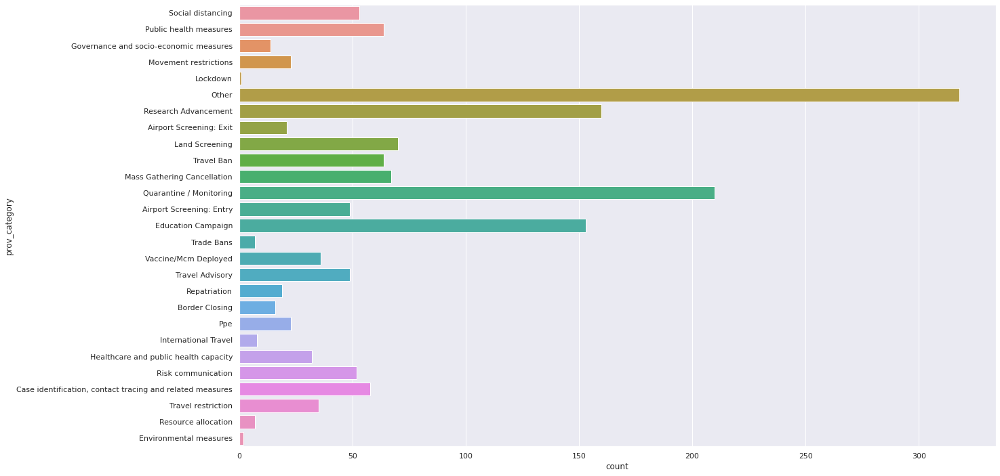

In [43]:
import seaborn as sns

sns.set(rc={'figure.figsize':(20,12)})
sns.set(style="darkgrid")
sns.countplot(y='prov_category', data=df_phsm_china)

# We can see the count of public measures by their type during the peek of the covid19 period in china.
# It is obvious that almost all mesaures are covid related, and usually have negative conotation by that they are restricting more.
# By these we can see how the virus affeted on the focus of the goverment. The goverment is now focusing on restircting, canceling, lockdown etc.

In [70]:
import afinn
import numpy as np

# In addition let's use sentiment analysis on the `prov_category` in order to support our claim.
afinn_object = afinn.Afinn()

def apply_affin(x):
    return afinn_object.score(x)

df_phsm_china = df_phsm_china.replace(np.nan, '', regex=True)
df_phsm_china['affin_score'] = df_phsm_china['prov_category'].apply(apply_affin)
number_not_zeros = df_phsm_china['affin_score'].astype(bool).sum(axis=0)
print(f"avg afinn score is: {df_phsm_china['affin_score'].sum()/float(number_not_zeros)}")


avg afinn score is: -2.0


Influence of `COVID-19` on **education**:

In [3]:
import pandas as pd
import numpy as np

df_education = pd.read_csv('https://query.data.world/s/tx2u2gwb4swij7vykpg57wsrukzozn')
df_education_china = df_education[df_education['Country'] == 'China']

# in order to have a more accurate status of the eductaion we will give each note a grade
# since it adds more information regarding the state

scale_reward_dict = {
    'Localized':1,
    'National':2,
}

note_reward_dict = {
    'School re-opening is progressive, and in selected regions, generally starting with students in the last year of secondary education. However, in larger regions, most schools remain closed':0.5,
    'Some schools have re-opened in certain regions, but most remain closed':0.75,
    np.nan : 1
}

df_education_china['datetime'] = pd.to_datetime(df_education_china['Date'])  
df_education_china = df_education_china[df_education_china['datetime'] < '2020-06-01']
df_education_china['Note'] = df_education_china['Note'].replace(note_reward_dict)
df_education_china['Scale'] = df_education_china['Scale'].replace(scale_reward_dict)
df_education_china['education_status'] = df_education_china['Note'] + df_education_china['Scale'] 
df_education_china

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


,Date,ISO,Country,Scale,Note,datetime,education_status
0,16/02/2020,CHN,China,1,1.0,2020-02-16,2.0
2,17/02/2020,CHN,China,1,1.0,2020-02-17,2.0
4,18/02/2020,CHN,China,1,1.0,2020-02-18,2.0
6,19/02/2020,CHN,China,1,1.0,2020-02-19,2.0
8,20/02/2020,CHN,China,1,1.0,2020-02-20,2.0
...,...,...,...,...,...,...,...
22431,01/07/2020,CHN,China,1,1.0,2020-01-07,2.0
22641,02/07/2020,CHN,China,1,1.0,2020-02-07,2.0
22851,03/07/2020,CHN,China,1,1.0,2020-03-07,2.0
23061,04/07/2020,CHN,China,1,1.0,2020-04-07,2.0


No handles with labels found to put in legend.


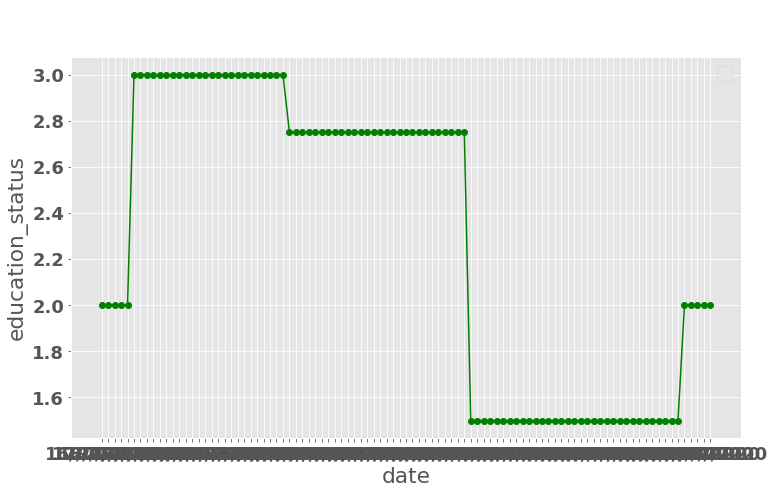

In [29]:
import seaborn as sns
import matplotlib.pyplot as plt


plt.style.use('ggplot')
font = {'family' : 'normal',
        'weight' : 'bold',
        'size'   : 18}

plt.rc('font', **font)
fig = plt.figure(figsize=(12, 7))
fig.suptitle('test title')
plt.xlabel('date')
plt.ylabel('education_status')
plt.legend()
plt.plot(df_education_china['Date'], df_education_china['education_status'], 'g-o')

# The idea behind this model is grading each combination of Note and Scale regarding 
# education status, and by summing them seeing a bigger picture.
# Higher result means worse state of school - i.e. close in national scale.
# each of the possible Note value can ease the state - for example 'Some schools have re-opened in certain regions' Note
# clearly means an ease, hence the grade of this Note is lower.

# The general direction seems correct - at the begging the schools were'nt closed yet, then
# they were all shut at once and later gradually opened.